# Market Segmentation
### This is project task under the internship of Feynn Labs
#### As part of the FeyNN Labs internship, I conducted a comprehensive analysis of the electric vehicle (EV) market in India using segmentation techniques. The objective was to identify distinct customer segments most likely to adopt electric vehicles, thereby informing a strategic market entry approach for an EV startup.

## Step 1 Data Loading and some exploration
Here we load the dataset and perform some explorations

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# 3D plotting tools from matplotlib
from mpl_toolkits.mplot3d import Axes3D

# Plotly for interactive 3D visualizations
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import gaussian_kde

# Importing datasets from sklearn for additional flexibility
from sklearn import datasets
# Plotly figure factory for advanced plots
import plotly.figure_factory as ff


In [19]:
# Reading the dataset
csv_file = 'processed_data.csv'
df = pd.read_csv(csv_file)


In [20]:
# Extracting the relevant columns
columns_of_interest = ['Age', 'Marital Status', 'No of Dependents', 'Personal Loan', 'House Loan', 'Wife Working', 'Salary', 'Wife Salary', 'Total Salary']
df = df[columns_of_interest]


In [21]:
# Showing the initial rows of the dataset
print("Initial rows of the dataset:", df.head())


Initial rows of the dataset:    Age  Marital Status  No of Dependents  Personal Loan  House Loan  \
0   58               1                 2              1           1   
1   48               0                 2              0           0   
2   34               0                 4              1           0   
3   27               1                 0              0           1   
4   40               1                 1              0           1   

   Wife Working  Salary  Wife Salary  Total Salary  
0             0   96174            0         96174  
1             0   52431            0         52431  
2             0   47285            0         47285  
3             1   84213       125150        209363  
4             0   62083            0         62083  


In [22]:
# Checking the structure of the dataframe
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Age               10000 non-null  int64
 1   Marital Status    10000 non-null  int64
 2   No of Dependents  10000 non-null  int64
 3   Personal Loan     10000 non-null  int64
 4   House Loan        10000 non-null  int64
 5   Wife Working      10000 non-null  int64
 6   Salary            10000 non-null  int64
 7   Wife Salary       10000 non-null  int64
 8   Total Salary      10000 non-null  int64
dtypes: int64(9)
memory usage: 703.2 KB
None


In [23]:
# Printing summary statistics
print("\nSummary statistics:")
print(df.describe())



Summary statistics:
                Age  Marital Status  No of Dependents  Personal Loan  \
count  10000.000000    10000.000000      10000.000000   10000.000000   
mean      39.561800        0.616000          2.004300       0.499100   
std       11.454986        0.486382          1.414737       0.500024   
min       20.000000        0.000000          0.000000       0.000000   
25%       30.000000        0.000000          1.000000       0.000000   
50%       40.000000        1.000000          2.000000       0.000000   
75%       49.000000        1.000000          3.000000       1.000000   
max       59.000000        1.000000          4.000000       1.000000   

         House Loan  Wife Working         Salary    Wife Salary   Total Salary  
count  10000.000000  10000.000000   10000.000000   10000.000000   10000.000000  
mean       0.498900      0.302000   95320.631700   25624.402500  120945.034200  
std        0.500024      0.459148   57486.863192   44183.888758   72829.153195  
min   

### Visualization

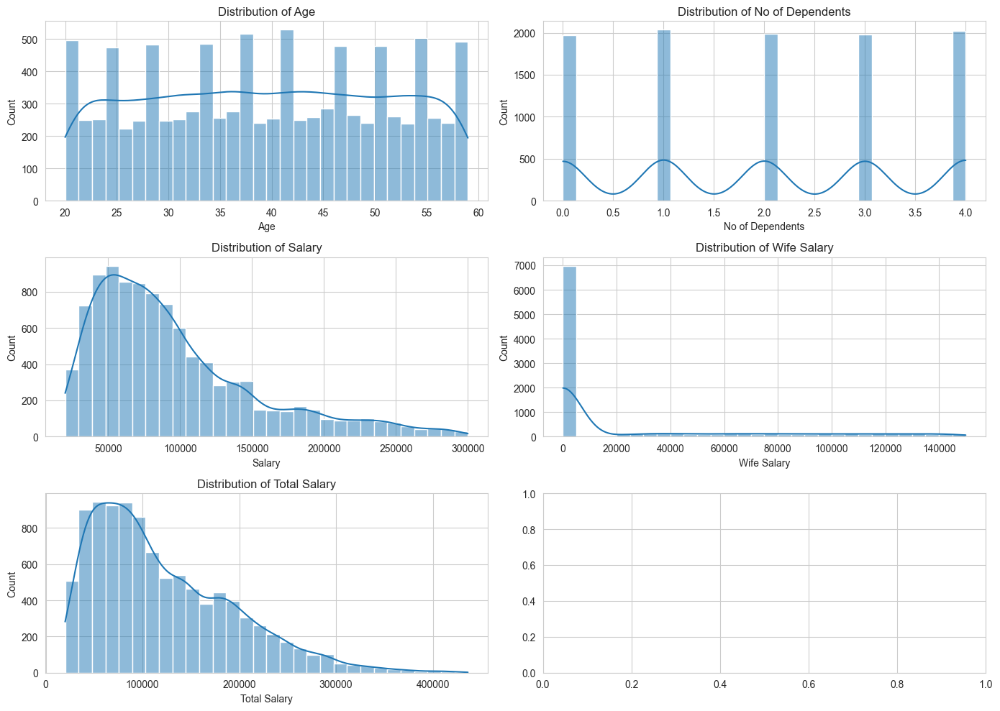

In [24]:
# Setting plot style
sns.set_style("whitegrid")

# Plotting histograms for numerical columns
num_cols = ['Age', 'No of Dependents', 'Salary', 'Wife Salary', 'Total Salary']
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(num_cols):
    sns.histplot(df[col], bins=30, ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {col}')
plt.tight_layout()
plt.show()


In [25]:
# Define numerical columns
num_cols = ['Age', 'No of Dependents', 'Salary', 'Wife Salary', 'Total Salary']

# Create subplots with 3 rows and 2 columns
fig = make_subplots(rows=3, cols=2, subplot_titles=num_cols)

# Iterate over each numerical column
for i, col in enumerate(num_cols):
    row = i // 2 + 1  # Calculate the row index (1-based)
    col_idx = i % 2 + 1  # Calculate the column index (1-based)
    
    # Create histogram trace for the column
    hist_trace = go.Histogram(x=df[col], nbinsx=30, name='Histogram')
    fig.add_trace(hist_trace, row=row, col=col_idx)
    
    # Create KDE (Kernel Density Estimation) using scipy
    kde = gaussian_kde(df[col])
    x_range = np.linspace(df[col].min(), df[col].max(), 100)
    kde_values = kde(x_range)
    
    # Add KDE trace for the column
    kde_trace = go.Scatter(x=x_range, y=kde_values, mode='lines', name='KDE', line=dict(color='red'))
    fig.add_trace(kde_trace, row=row, col=col_idx)
    
    # Update subplot titles and axis labels
    fig.update_xaxes(title_text=col, row=row, col=col_idx)
    fig.update_yaxes(title_text='Frequency', row=row, col=col_idx)

# Update overall layout
fig.update_layout(title='Distribution of Numerical Columns', height=800, width=1000,
                  showlegend=False)

# Display the plot
fig.show()


C:\Users\Umar\AppData\Local\Temp\ipykernel_5008\2969989636.py:15: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\Umar\AppData\Local\Temp\ipykernel_5008\2969989636.py:15: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\Umar\AppData\Local\Temp\ipykernel_5008\2969989636.py:15: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\Umar\AppData\Local\Temp\ipykernel_5008\2969989636.py:15: UserWarning:

FixedFormatter should only be used together with FixedLocator



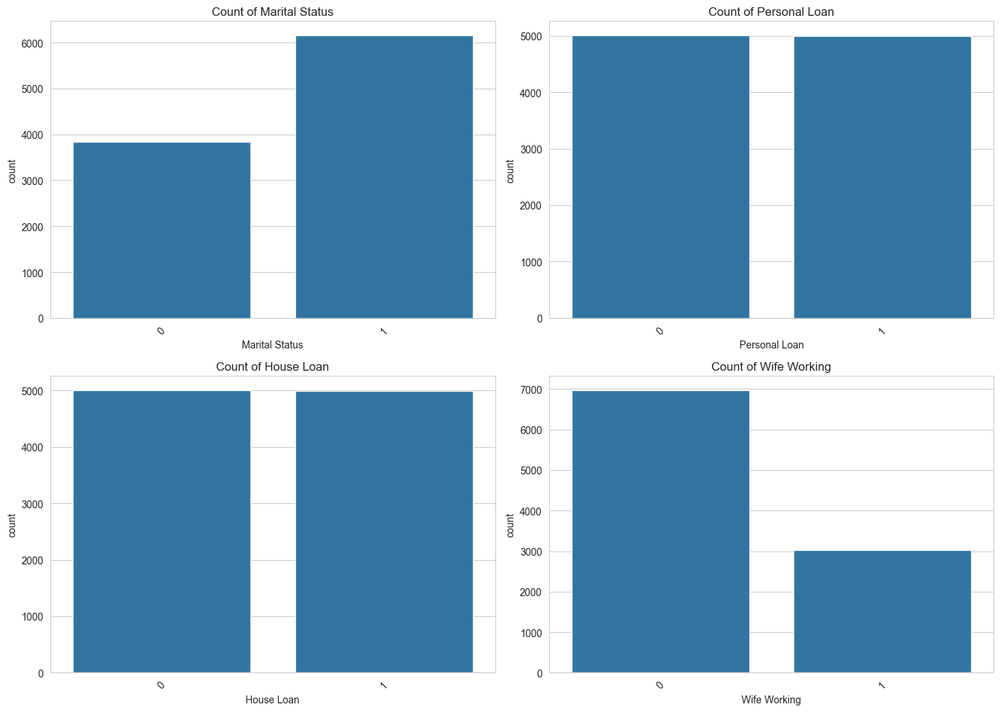

In [26]:
# Define categorical columns
cat_cols = ['Marital Status', 'Personal Loan', 'House Loan', 'Wife Working']

# Create subplots with 2 rows and 2 columns
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
axes = axes.flatten()

# Iterate over each categorical column
for i, col in enumerate(cat_cols):
    # Plot countplot for the column
    sns.countplot(x=df[col], ax=axes[i])
    
    # Set title and rotate x-axis labels for better readability
    axes[i].set_title(f'Count of {col}')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)
    
# Adjust layout and display the plot
plt.tight_layout()
plt.show()


# Step 2: Data Cleaning and Preparation
In this step, we clean the data and check for missing values and handle them accordingly

In [27]:
# Checking for missing values
print("\nMissing values in each column:")
print(df.isnull().sum())

# Checking for duplicate rows
print("\nDuplicated rows:")
print(df[df.duplicated()])

# Since there are no missing values and duplicated rows in the dataset, we proceed to the next step.



Missing values in each column:
Age                 0
Marital Status      0
No of Dependents    0
Personal Loan       0
House Loan          0
Wife Working        0
Salary              0
Wife Salary         0
Total Salary        0
dtype: int64

Duplicated rows:
Empty DataFrame
Columns: [Age, Marital Status, No of Dependents, Personal Loan, House Loan, Wife Working, Salary, Wife Salary, Total Salary]
Index: []


# Step 3: Manual Encoding of categorial variables
Here we encode the categorical variables in the data to make accurate models.

In [28]:
# Define encoding mappings
encoding_maps = {
    'Marital Status': {'Single': 0, 'Married': 1},
    'Personal Loan': {'No': 0, 'Yes': 1},
    'House Loan': {'No': 0, 'Yes': 1},
    'Wife Working': {'No': 0, 'Yes': 1}
}


In [29]:
# Apply the encoding
for col, mapping in encoding_maps.items():
    df[col] = df[col].replace(mapping)


# Step 4 Normalizing Numerical Columns
Machine Learning models work best when the data is normalised or is in a similar scale. In this step, we perform normalization on data

In [30]:
# Define numerical columns to be normalized
numerical_cols = ['Age', 'No of Dependents', 'Salary', 'Wife Salary', 'Total Salary']

# Initialize StandardScaler
scaler = StandardScaler()

# Normalize numerical columns
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

# Display processed data after normalization
print("\nProcessed data (after normalization):")
print(df.head())



Processed data (after normalization):
        Age  Marital Status  No of Dependents  Personal Loan  House Loan  \
0  1.609703               1         -0.003040              1           1   
1  0.736677               0         -0.003040              0           0   
2 -0.485560               0          1.410721              1           0   
3 -1.096678               1         -1.416800              0           1   
4  0.038256               1         -0.709920              0           1   

   Wife Working    Salary  Wife Salary  Total Salary  
0             0  0.014845    -0.579978     -0.340142  
1             0 -0.746114    -0.579978     -0.940797  
2             0 -0.835635    -0.579978     -1.011459  
3             1 -0.193230     2.252644      1.214107  
4             0 -0.578207    -0.579978     -0.808261  


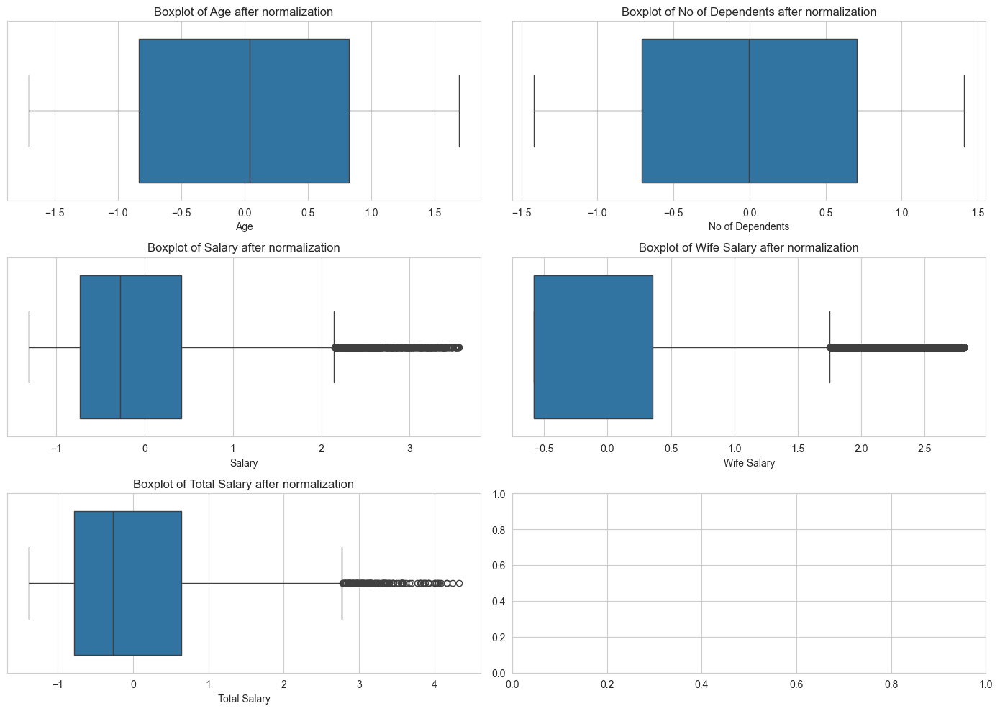

In [31]:
# Plotting boxplots for normalized numerical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(numerical_cols):
    sns.boxplot(x=df[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col} after normalization')
plt.tight_layout()
plt.show()


# Step 5: Applying PCA
Herein we'll reduce the dimensionality of data to 2 components using PCA

In [32]:
# Applying PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(df)
data_pca_df = pd.DataFrame(data_pca, columns=['PC1', 'PC2'])


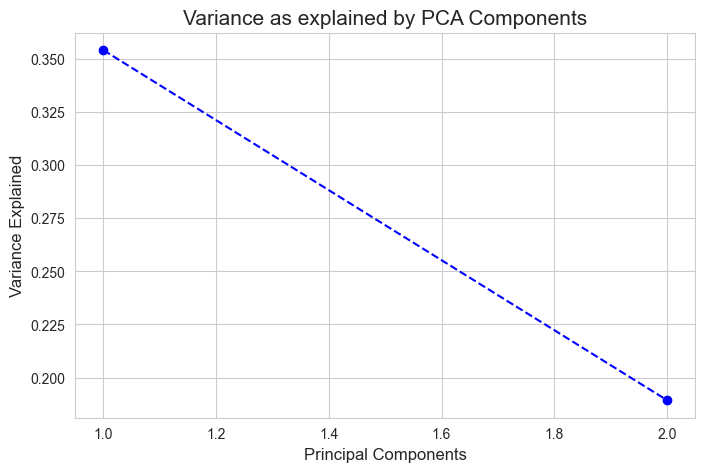

In [35]:
# Explained variance plot
plt.figure(figsize=(8, 5))
plt.plot(range(1, 3), pca.explained_variance_ratio_, marker='o', linestyle='--', color='b')
plt.title('Variance as explained by PCA Components', fontsize=15)
plt.xlabel('Principal Components', fontsize=12)
plt.ylabel('Variance Explained', fontsize=12)
plt.grid(True)
plt.show()


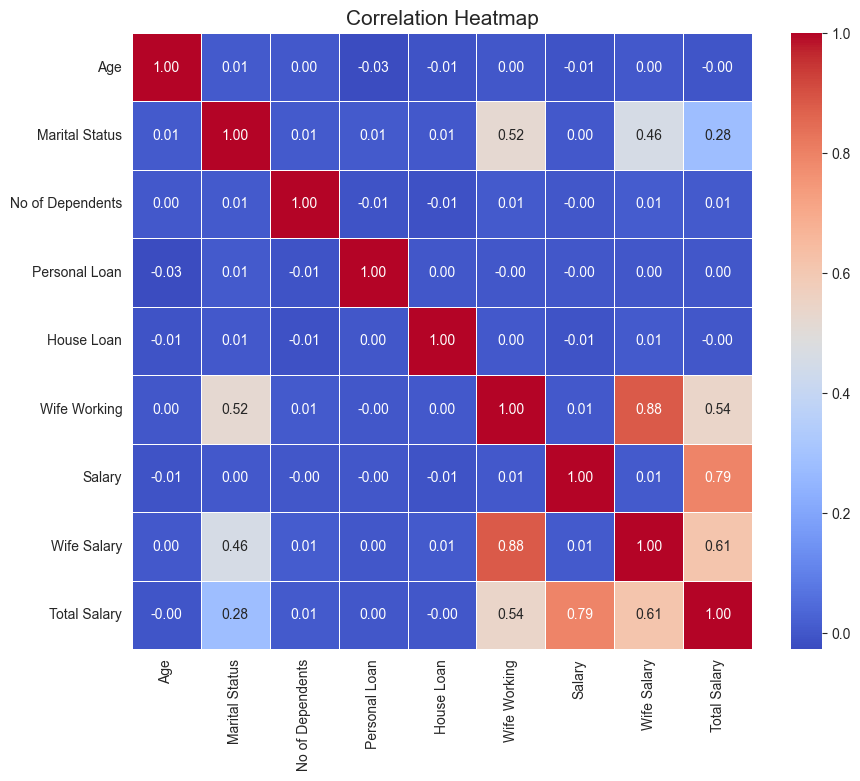

In [36]:
# Compute the correlation matrix
corr_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt=".2f")
plt.title('Correlation Heatmap', fontsize=15)
plt.show()


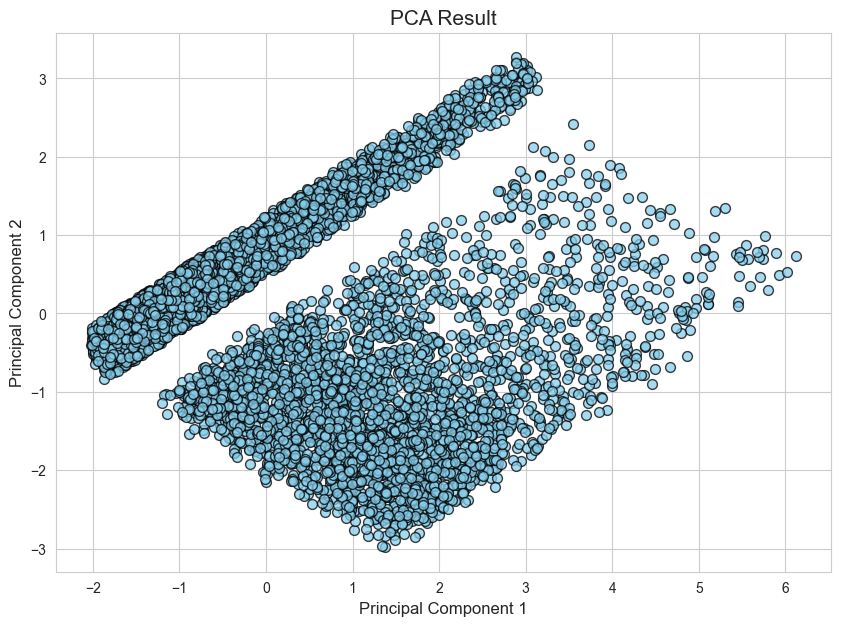

In [38]:
# Scatter plot of PCA result with a different color
plt.figure(figsize=(10, 7))
plt.scatter(data_pca_df['PC1'], data_pca_df['PC2'], s=50, c='skyblue', edgecolors='k', alpha=0.75)
plt.title('PCA Result', fontsize=15)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.grid(True)
plt.show()


# Step 6: Determining the Optimal Number of Clusters
Here we use K-means, an ML algorithm to find optimal number of clusters using the elbow method

c:\users\umar\appdata\local\programs\python\python39\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\users\umar\appdata\local\programs\python\python39\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\users\umar\appdata\local\programs\python\python39\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\users\umar\appdata\local\programs\python\python39\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\u

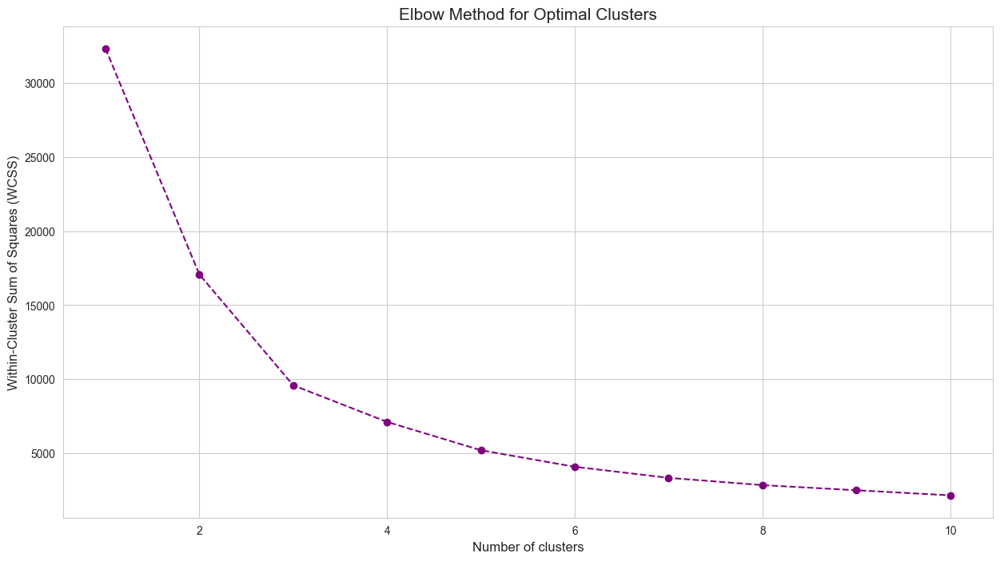

In [39]:
# Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_pca_df)
    wcss.append(kmeans.inertia_)

# Plotting the elbow method
plt.figure(figsize=(15, 8))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--', color='purple')
plt.title('Elbow Method for Optimal Clusters', fontsize=15)
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Within-Cluster Sum of Squares (WCSS)', fontsize=12)
plt.grid(True)
plt.show()


# Step 7: K-means Clustering
Here we apply K-Means clustering with the chosen number of clusters and then we visualize the clusters.

In [40]:
# Apply K-Means with the chosen number of clusters (e.g., 4 from the elbow plot)
optimal_clusters = 4  # This value should be chosen based on the elbow plot
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
clusters = kmeans.fit_predict(data_pca_df)
data_pca_df['Cluster'] = clusters


c:\users\umar\appdata\local\programs\python\python39\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [41]:
# Print the cluster centers
print("\nCluster centers (in PCA space):")
print(kmeans.cluster_centers_)



Cluster centers (in PCA space):
[[-1.1569947  -0.0715435 ]
 [ 1.40490034 -1.4533102 ]
 [ 2.62705656  1.53133458]
 [ 0.138282    0.89496215]]


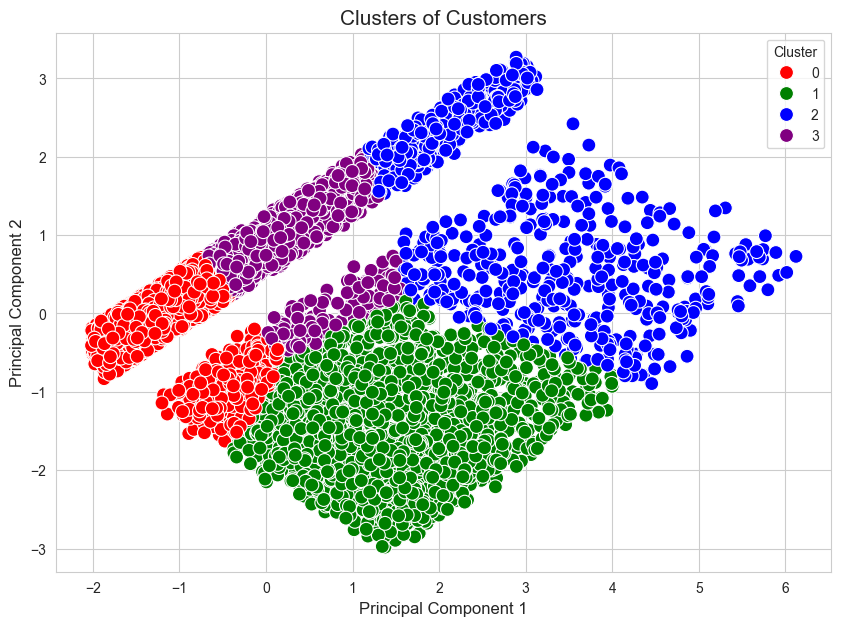

In [42]:
# Define custom colors for clusters
cluster_colors = ['red', 'green', 'blue', 'purple']  # Adjust colors as needed

# Plotting the clusters with custom colors
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=data_pca_df, palette=cluster_colors, s=100)
plt.title('Clusters of Customers', fontsize=15)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


In [43]:
# Calculate the size of each cluster
cluster_sizes = data_pca_df['Cluster'].value_counts().sort_index()

# Print cluster sizes
print("\nCluster sizes:")
print(cluster_sizes)



Cluster sizes:
0    4841
1    2063
2     917
3    2179
Name: Cluster, dtype: int64


# Step 8: 3D Visualization of Clusters
Here we plot the clusters in 3D for a more detailed visualization.

In [45]:
# Apply PCA with 3 components
pca_3d = PCA(n_components=3)
data_pca_3d = pca_3d.fit_transform(df)
data_pca_3d_df = pd.DataFrame(data_pca_3d, columns=['PC1', 'PC2', 'PC3'])

# Assign cluster labels from previous K-Means clustering
data_pca_3d_df['Cluster'] = clusters


In [46]:
data_pca_3d_df

,PC1,PC2,PC3,Cluster
0,-0.523528,0.250451,1.194349,0
1,-1.428994,-0.056132,0.549618,0
2,-1.503298,-0.151586,0.605982,0
3,1.992467,-1.554702,-1.960767,1
4,-1.140990,-0.013316,-0.453394,0
...,...,...,...,...
9995,-0.022185,1.236324,-1.966316,3
9996,-1.055085,0.285306,-0.269728,0
9997,4.107340,1.782347,-1.374297,2
9998,-1.282314,-0.255496,0.608547,0


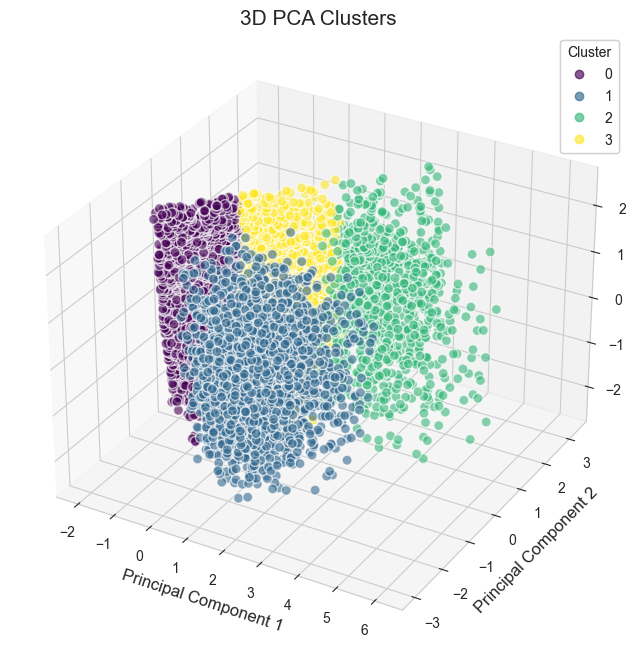

In [47]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(data_pca_3d_df['PC1'], data_pca_3d_df['PC2'], data_pca_3d_df['PC3'], 
                     c=data_pca_3d_df['Cluster'], cmap='viridis', s=50, alpha=0.6, edgecolors='w')

# Setting labels and title
ax.set_title('3D PCA Clusters', fontsize=15)
ax.set_xlabel('Principal Component 1', fontsize=12)
ax.set_ylabel('Principal Component 2', fontsize=12)
ax.set_zlabel('Principal Component 3', fontsize=12)

# Adding legend
legend = ax.legend(*scatter.legend_elements(), title='Cluster')
ax.add_artist(legend)

plt.show()


In [49]:
# Apply PCA with 3 components
pca_3d = PCA(n_components=3)
data_pca_3d = pca_3d.fit_transform(df)
data_pca_3d_df = pd.DataFrame(data_pca_3d, columns=['PC1', 'PC2', 'PC3'])

# Assign cluster labels from previous K-Means clustering
data_pca_3d_df['Cluster'] = clusters


In [50]:
import plotly.express as px

# Create the 3D scatter plot using Plotly Express
fig = px.scatter_3d(data_pca_3d_df, x='PC1', y='PC2', z='PC3', color='Cluster',
                    title='3D PCA Clusters', opacity=0.7, size_max=10,
                    color_continuous_scale='viridis', hover_name='Cluster')

# Update the layout
fig.update_layout(scene=dict(xaxis_title='Principal Component 1',
                             yaxis_title='Principal Component 2',
                             zaxis_title='Principal Component 3'),
                  width=800, height=600)

# Display the plot
fig.show()


# Step 9: Interpretation of Results
Finally in this step we interpret the results of the clustering and fathom the characteristics of each segment.

In [52]:
# Adding cluster labels to the original data
df['Cluster'] = clusters

In [62]:
# Group by Cluster and compute mean values
cluster_summary = df.groupby('Cluster').mean()

# Print the cluster summary
print("Summary of Clusters (Mean Values):")
print(cluster_summary)


Summary of Clusters (Mean Values):
              Age  Marital Status  No of Dependents  Personal Loan  \
Cluster                                                              
0        0.018960        0.496592          0.013899       0.503615   
1        0.024291        1.000000          0.062749       0.499273   
2       -0.035908        0.681570         -0.060854       0.510360   
3       -0.050008        0.490133         -0.064677       0.484167   

         House Loan  Wife Working    Salary  Wife Salary  Total Salary  
Cluster                                                                 
0          0.500930      0.085520 -0.619626    -0.511081     -0.799157  
1          0.500727      1.000000 -0.260154     1.658828      0.801026  
2          0.489640      0.427481  2.308639     0.227207      1.960139  
3          0.496558      0.069298  0.651348    -0.530687      0.192177  


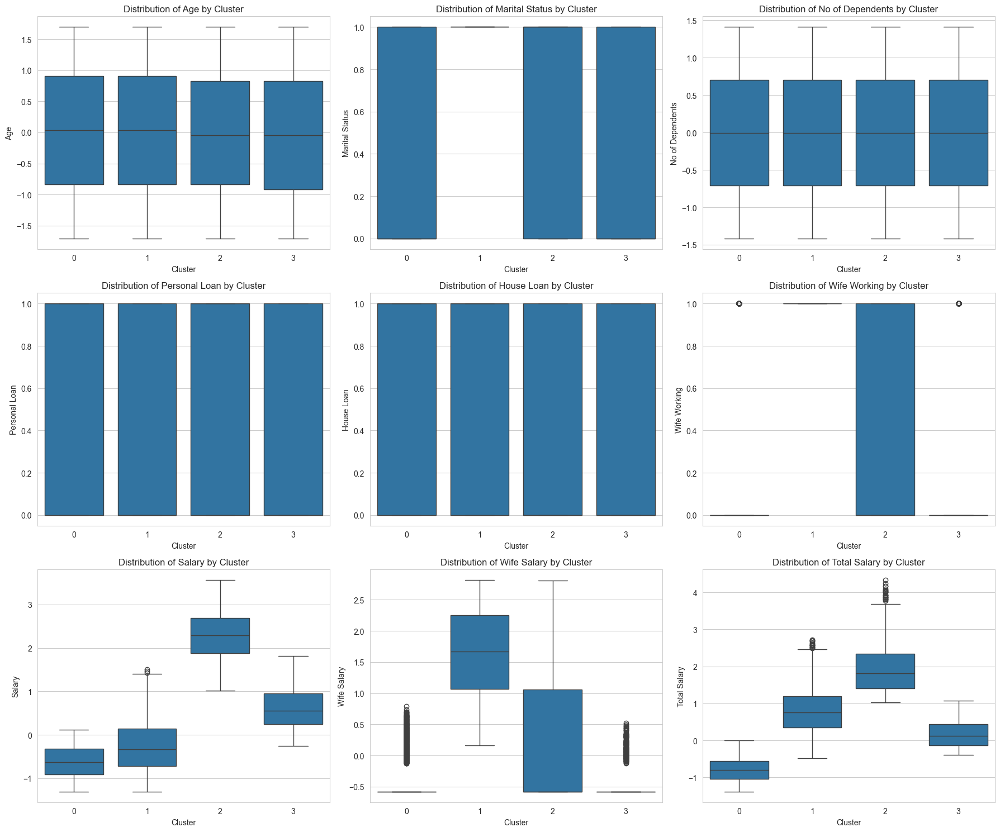

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the distribution of each variable across clusters
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()
for i, col in enumerate(df.columns[:-1]):  # Exclude the 'Cluster' column
    sns.boxplot(x='Cluster', y=col, data=df, ax=axes[i])
    axes[i].set_title(f'Distribution of {col} by Cluster')
plt.tight_layout()
plt.show()


In [60]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplots with 3 rows and 3 columns
fig = make_subplots(rows=3, cols=3, subplot_titles=df.columns[:-1])

# Iterate over each variable (excluding the 'Cluster' column)
for i, col in enumerate(df.columns[:-1]):
    row = i // 3 + 1  # Calculate the row index
    col_idx = i % 3 + 1  # Calculate the column index
    
    # Create box plots for each cluster
    for cluster in df['Cluster'].unique():
        trace = go.Box(y=df[df['Cluster'] == cluster][col], name=f'Cluster {cluster}')
        fig.add_trace(trace, row=row, col=col_idx)
    
    # Update the axis title for each subplot
    fig.update_yaxes(title_text=col, row=row, col=col_idx)

# Update the layout
fig.update_layout(title='Distribution of Variables by Cluster', height=800, width=1000,
                  showlegend=False)

# Display the plot
fig.show()
